## Setup libraries

In [1]:
from PIL import Image, ImageDraw
import pydicom

from fastai.data.all import *

Copy `get_dicom_files` from fastai medical library since it gives a warning when importing from the library.

In [3]:
def get_dicom_files(path, recurse=True, folders=None):
    "Get dicom files in `path` recursively, only in `folders`, if specified."
    return get_files(path, extensions=[".dcm",".dicom"], recurse=recurse, folders=folders)

## Get DataFrame

In [4]:
in_path = Path('src')

In [7]:
def load_df():
    global df
    df = pd.read_pickle(in_path / 'train_clean.pkl')

In [8]:
load_df()

In [9]:
df.head(2)

,id,StudyInstanceUID,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,boxes_list,labels_list,label
0,000a312787f2.dcm,5776db0cec75,0,1,0,0,"[[789.28836, 582.43035, 1815.94498, 2499.73327], [2245.91208, 591.20528, 3340.5737, 2352.75472]]","[Typical, Typical]",Typical
1,000c3a3f293f.dcm,ff0879eb20ed,1,0,0,0,"[[0.0, 0.0, 1.0, 1.0]]",[Negative],Negative


In [10]:
df.boxes_list[0]

array([[ 789.28836,  582.43035, 1815.94498, 2499.73327],
       [2245.91208,  591.20528, 3340.5737 , 2352.75472]])

## Get a list of all the .dicom files with a Bounding Box

In [11]:
files = get_dicom_files(in_path)
fn = files[0]

Take a look at a single image

In [12]:
arr = pydicom.read_file(fn).pixel_array
img = Image.fromarray(((arr / arr.max()) * 255).astype(np.uint8))

In [13]:
boxes = df.loc[df['id'] == fn.name, 'boxes_list'].values[0]
box = boxes[0]
x0, y0, x1, y1 = box

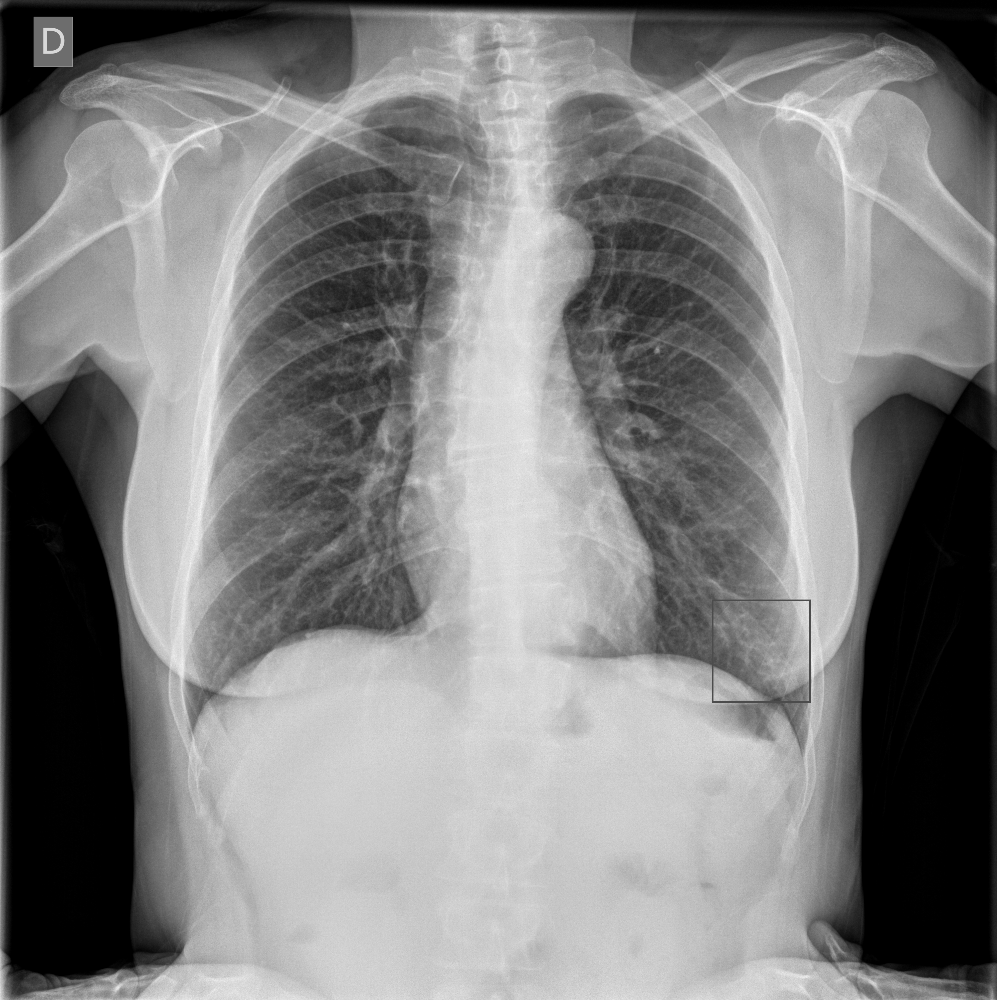

In [14]:
img1 = ImageDraw.Draw(img)
shape = [(x0, y0), (x1,y1)]
img1.rectangle(shape, outline ="red", width = 5)
img

Normalize the RGB values

In [15]:
res_img = Image.fromarray(((arr / arr.max()) * 255).astype(np.uint8))

## Resize image

In [16]:
height = 512
w, h = res_img.width, res_img.height
ratio = w / h
width = int(height * ratio)
small_img = res_img.resize((height, width))

## Resize Bounding Box

In [17]:
x0_n, y0_n, x1_n, y1_n = x0 / w * width, y0 / h * height, x1 / w * width, y1 / h * height

## Draw results

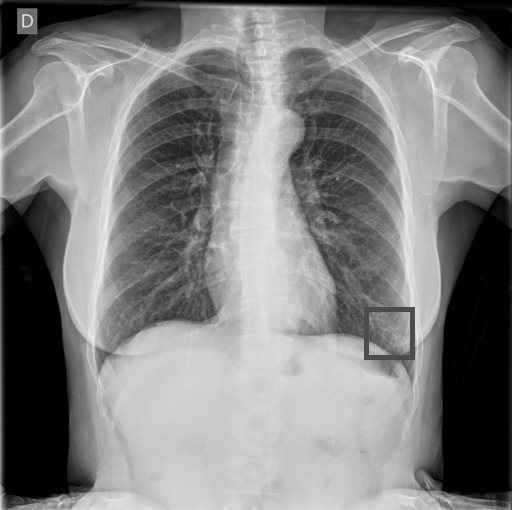

In [18]:
img2 = ImageDraw.Draw(small_img)
shape = [(x0_n, y0_n), (x1_n, y1_n)]
img2.rectangle(shape, outline ="red", width = 5)
small_img

Function to get the aspect ratio of an image

In [19]:
def get_scalar(fn, new_width = 1024):
    width = pydicom.read_file(fn).Columns
    return new_width / width

In [20]:
new_width = 1024
λ = get_scalar(fn, new_width)

Function to resize a single Bounding Box

In [32]:
def resize_box(b, scalar):
    if type(b) == np.ndarray:
        if np.array_equal(b, np.array([0., 0., 1., 1.,])): 
            return b
        else:
            return np.around(b * scalar, decimals = 3)
    else:
        if b == [0., 0., 1., 1.]:
            return b
        else:
            return [round(e * scalar, 3) for e in b]

In [33]:
small_box = resize_box(box, λ)
small_box

array([731.128, 615.792, 832.932, 721.321])

Function to resize a list of Bounding Boxes

In [34]:
def resize_boxes(boxes, scalar):
    return np.array([resize_box(b, scalar) for b in boxes])

In [35]:
small_boxes = resize_boxes(boxes, λ)
small_boxes

array([[731.128, 615.792, 832.932, 721.321]])

Get the list of Bounding Boxes from the dataframe

In [36]:
def get_boxes(fn):
    return df.loc[df['id'] == fn.name, 'boxes_list'].values[0]

Change the Bounding Box format to list of tuples

In [37]:
def format_box(box):
    x0, y0, x1, y1 = box
    return [(x0, y0), (x1, y1)]

## Test the process

In [38]:
def test_resize(fn, new_width):
    arr = pydicom.read_file(fn).pixel_array
    orig_img = Image.fromarray(((arr / arr.max()) * 255).astype(np.uint8))
    new_img = orig_img.copy()
        
    
    boxes = get_boxes(fn)
    
    ## Original image
    img1 = ImageDraw.Draw(orig_img)
    for box in boxes:
        shape = format_box(box)
        img1.rectangle(shape, outline ="red", width = 5)
        
    ## Resized Image
    scalar = get_scalar(fn, new_width)
    new_height = int(new_img.height * scalar)
    new_img = new_img.resize((new_width, new_height))
    new_boxes = resize_boxes(boxes, scalar)
    
    img2 = ImageDraw.Draw(new_img)
    for box in new_boxes:
        shape = format_box(box)
        img2.rectangle(shape, outline ="red", width = 5)
    
    return orig_img, new_img

In [39]:
x,y = test_resize(fn, 1024)
df[df['id'] == fn.name]

,id,StudyInstanceUID,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,boxes_list,labels_list,label
1553,3a5a28071e03.dcm,26b07f9e9e24,0,0,1,0,"[[2139.11972, 1801.67352, 2436.97714, 2110.4280400000002]]",[Indeterminate],Indeterminate


(2996, 3004)


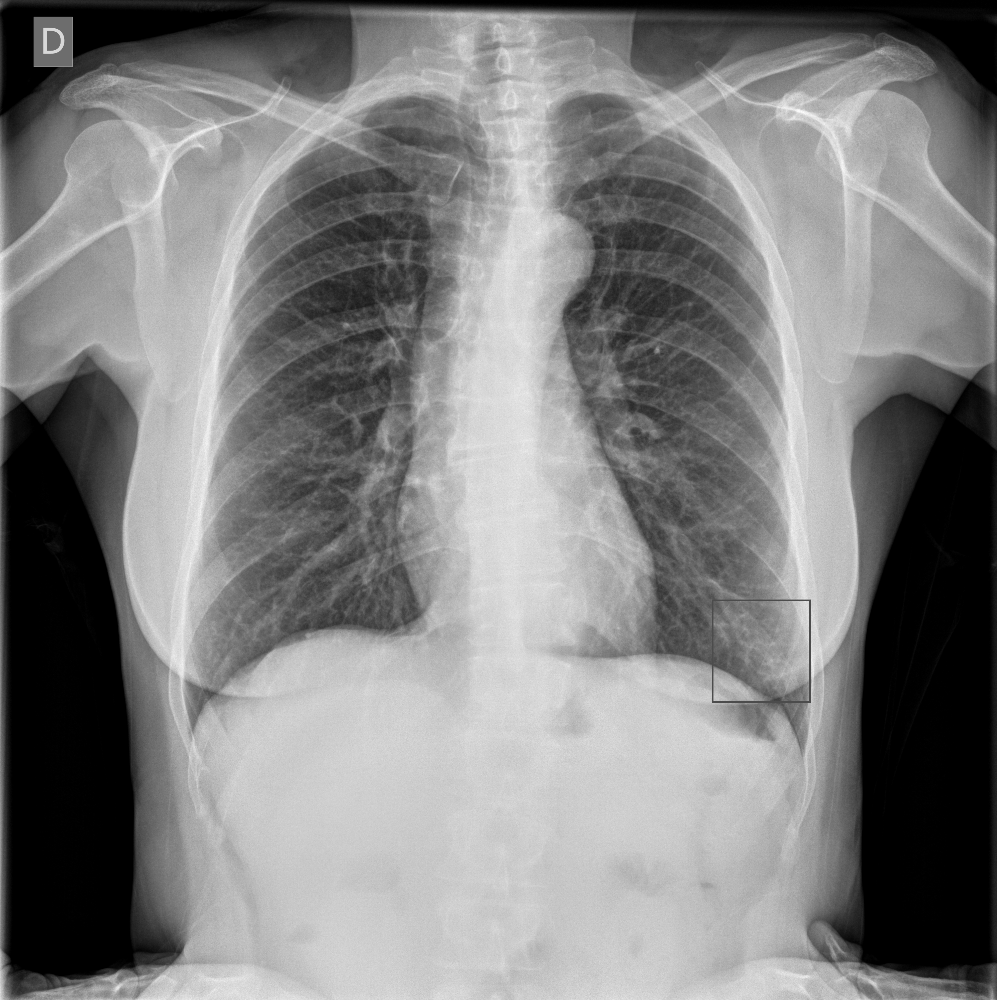

In [40]:
print(x.size)
x

(1024, 1026)


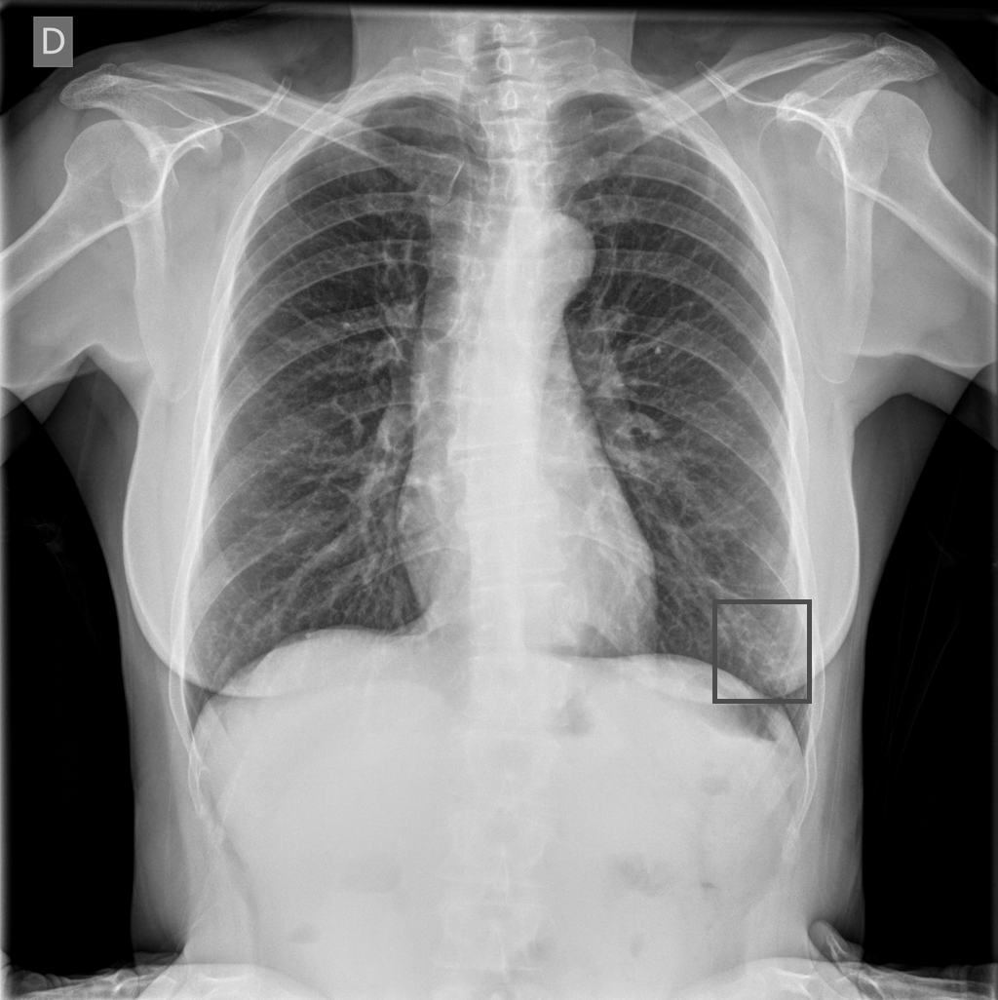

In [41]:
print(y.size)
y

## Process all Bounding Boxes and write the results to the dataframe

In [42]:
def write_box(fn):
    
    idx = df[df['id'] == fn.name].index[0]
    
    if df.loc[idx, 'label'] == 'Negative':
        df.at[idx, 'scalar'] = np.nan
        df.at[idx, 'resized_boxes'] = df.loc[idx, 'boxes_list']
    else:
        boxes = get_boxes(fn)
        scalar = get_scalar(fn, new_width = 1024)

        new_boxes = resize_boxes(boxes, scalar)

        df.at[idx, 'scalar'] = scalar
        df.at[idx, 'resized_boxes'] = new_boxes

Initialize `resized_boxes`

In [43]:
df['resized_boxes'] = np.zeros((df.shape[0],), dtype = object)

In [44]:
train_files = get_dicom_files(in_path / 'train')
m = len(train_files)
print(m)
for i,fn in enumerate(train_files):
    print(f'{(i / m * 100):5.2f}%', end='\r')
    write_box(fn)

6334


In [45]:
df.head()

,id,StudyInstanceUID,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,boxes_list,labels_list,label,resized_boxes,scalar
0,000a312787f2.dcm,5776db0cec75,0,1,0,0,"[[789.28836, 582.43035, 1815.94498, 2499.73327], [2245.91208, 591.20528, 3340.5737, 2352.75472]]","[Typical, Typical]",Typical,"[[189.904, 140.134, 436.919, 601.44], [540.37, 142.245, 803.747, 566.076]]",0.240602
1,000c3a3f293f.dcm,ff0879eb20ed,1,0,0,0,"[[0.0, 0.0, 1.0, 1.0]]",[Negative],Negative,"[[0.0, 0.0, 1.0, 1.0]]",NaN
2,0012ff7358bc.dcm,9d514ce429a7,0,1,0,0,"[[677.42216, 197.97662, 1545.21983, 1197.75876], [1792.69064, 402.5525, 2409.71798, 1606.9105]]","[Typical, Typical]",Typical,"[[226.99, 66.338, 517.77, 401.343], [600.692, 134.887, 807.445, 538.441]]",0.335079
3,001398f4ff4f.dcm,28dddc8559b2,0,0,0,1,"[[2729.0, 2181.33331, 3677.00012, 2785.33331]]",[Atypical],Atypical,"[[652.92, 521.889, 879.731, 666.398]]",0.239252
4,001bd15d1891.dcm,dfd9fdd85a3e,0,1,0,0,"[[623.23328, 1050.0, 1337.23328, 2156.0], [2578.56661, 998.66667, 3241.23328, 2118.66667]]","[Typical, Typical]",Typical,"[[187.263, 315.493, 401.798, 647.812], [774.781, 300.069, 973.892, 636.595]]",0.300469


## Save the results to pickle (since .csv loses the dtype of the boxes)

In [46]:
df.to_pickle(in_path / 'train_ready.pkl')